In [ ]:
%matplotlib inline

In [ ]:


# Representational Similarity Analysis - Class Exercise

I perform RSA to get summary statistics on the supervised classification of 24 categories of the 94 pictures from the "isual_92_categories" MNE dataset. 


In [17]:
# Loading Functions
import os.path as op
import numpy as np
from pandas import read_csv
import matplotlib.pyplot as plt

# Loadng Classificaton Model
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.manifold import MDS

# Loading Data
import mne
from mne.io import read_raw_fif, concatenate_raws
from mne.datasets import visual_92_categories

# Path to Data
data_path = visual_92_categories.data_path()

# Make Dataframe joining stimulus - trigger mapping
fname = op.join(data_path, 'visual_stimuli.csv')
conds = read_csv(fname)
print(conds.head(24)) # Print the first 24 coloumns

    trigger       condition  human  face  animal  natural
0         0  human bodypart      1     0       1        1
1         1  human bodypart      1     0       1        1
2         2  human bodypart      1     0       1        1
3         3  human bodypart      1     0       1        1
4         4  human bodypart      1     0       1        1
5         5  human bodypart      1     0       1        1
6         6  human bodypart      1     0       1        1
7         7  human bodypart      1     0       1        1
8         8  human bodypart      1     0       1        1
9         9  human bodypart      1     0       1        1
10       10  human bodypart      1     0       1        1
11       11  human bodypart      1     0       1        1
12       12      human face      1     1       1        1
13       13      human face      1     1       1        1
14       14      human face      1     1       1        1
15       15      human face      1     1       1        1
16       16   

To limit computational time only the first 24 images will be used



In [2]:
max_trigger = 24
conds = conds[:max_trigger]  # Takes the 24 rows outlined above

Here we define the stimulus - trigger mapping



In [3]:
conditions = []
for c in conds.values:
    cond_tags = list(c[:2])
    cond_tags += [('not-' if i == 0 else '') + conds.columns[k]
                  for k, i in enumerate(c[2:], 2)]
    conditions.append('/'.join(map(str, cond_tags)))
print(conditions[:10])

['0/human bodypart/human/not-face/animal/natural', '1/human bodypart/human/not-face/animal/natural', '2/human bodypart/human/not-face/animal/natural', '3/human bodypart/human/not-face/animal/natural', '4/human bodypart/human/not-face/animal/natural', '5/human bodypart/human/not-face/animal/natural', '6/human bodypart/human/not-face/animal/natural', '7/human bodypart/human/not-face/animal/natural', '8/human bodypart/human/not-face/animal/natural', '9/human bodypart/human/not-face/animal/natural']


Let's make the event_id dictionary



In [20]:
event_id = dict(zip(conditions, conds.trigger + 1))
print(event_id)

{'0/human bodypart/human/not-face/animal/natural': 1, '1/human bodypart/human/not-face/animal/natural': 2, '2/human bodypart/human/not-face/animal/natural': 3, '3/human bodypart/human/not-face/animal/natural': 4, '4/human bodypart/human/not-face/animal/natural': 5, '5/human bodypart/human/not-face/animal/natural': 6, '6/human bodypart/human/not-face/animal/natural': 7, '7/human bodypart/human/not-face/animal/natural': 8, '8/human bodypart/human/not-face/animal/natural': 9, '9/human bodypart/human/not-face/animal/natural': 10, '10/human bodypart/human/not-face/animal/natural': 11, '11/human bodypart/human/not-face/animal/natural': 12, '12/human face/human/face/animal/natural': 13, '13/human face/human/face/animal/natural': 14, '14/human face/human/face/animal/natural': 15, '15/human face/human/face/animal/natural': 16, '16/human face/human/face/animal/natural': 17, '17/human face/human/face/animal/natural': 18, '18/human face/human/face/animal/natural': 19, '19/human face/human/face/ani

Read MEG data



In [22]:
n_runs = 4  # 4 for full data (use less to speed up computations)
fname = op.join(data_path, 'sample_subject_%i_tsss_mc.fif')
raws = [read_raw_fif(fname % block, verbose='error')
        for block in range(n_runs)]  # ignore filename warnings
raw = concatenate_raws(raws)

events = mne.find_events(raw, min_duration=.002)

events = events[events[:, 2] <= max_trigger]

4142 events found
Event IDs: [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93 200 222 244]


Epoch data



In [23]:
picks = mne.pick_types(raw.info, meg=True)
epochs = mne.Epochs(raw, events=events, event_id=event_id, baseline=None,
                    picks=picks, tmin=-.1, tmax=.500, preload=True)

Not setting metadata
Not setting metadata
720 matching events found
No baseline correction applied
0 projection items activated
Loading data for 720 events and 601 original time points ...
0 bad epochs dropped


Plotting our 'face' and 'not-face' conditions



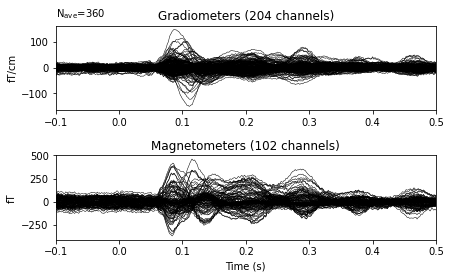

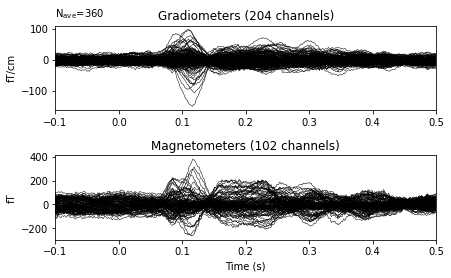

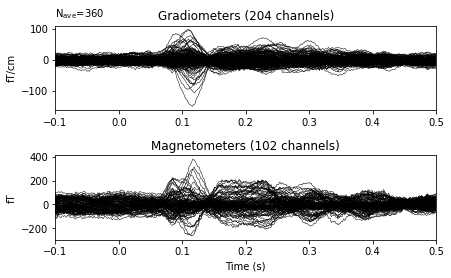

In [25]:
epochs['face'].average().plot()
epochs['not-face'].average().plot()

RSA refer to statistics applied to the confusion matrix also called the representational dissimilarity matrices (RDM).

Now we'll use a multiclass classifier (Multinomial Logistic Regression)

We'll use a ROC-AUC as performance metric while the

And to spare time we'll only use RSA on a window of data while Cichy et al. did it for all time
instants separately.



In [26]:
# Classify using the average signal in the window 50ms to 300ms
# to focus the classifier on the time interval with best SNR.
clf = make_pipeline(StandardScaler(),
                    LogisticRegression(C=1, solver='liblinear',
                                       multi_class='auto'))
X = epochs.copy().crop(0.05, 0.3).get_data().mean(axis=2)
y = epochs.events[:, 2]

classes = set(y)
cv = StratifiedKFold(n_splits=5, random_state=0, shuffle=True)

# Compute confusion matrix for each cross-validation fold
y_pred = np.zeros((len(y), len(classes)))
for train, test in cv.split(X, y):
    # Fit
    clf.fit(X[train], y[train])
    # Probabilistic prediction (necessary for ROC-AUC scoring metric)
    y_pred[test] = clf.predict_proba(X[test])

Compute confusion matrix using ROC-AUC



In [27]:
confusion = np.zeros((len(classes), len(classes)))
for ii, train_class in enumerate(classes):
    for jj in range(ii, len(classes)):
        confusion[ii, jj] = roc_auc_score(y == train_class, y_pred[:, jj])
        confusion[jj, ii] = confusion[ii, jj]

Plot



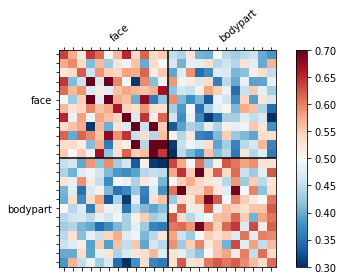

In [28]:
labels = [''] * 5 + ['face'] + [''] * 11 + ['bodypart'] + [''] * 6
fig, ax = plt.subplots(1)
im = ax.matshow(confusion, cmap='RdBu_r', clim=[0.3, 0.7])
ax.set_yticks(range(len(classes)))
ax.set_yticklabels(labels)
ax.set_xticks(range(len(classes)))
ax.set_xticklabels(labels, rotation=40, ha='left')
ax.axhline(11.5, color='k')
ax.axvline(11.5, color='k')
plt.colorbar(im)
plt.tight_layout()
plt.show()

In [ ]:
Confusion matrix related to mental representations have been historically
summarized with dimensionality reduction using multi-dimensional scaling.
See how the face samples cluster together.



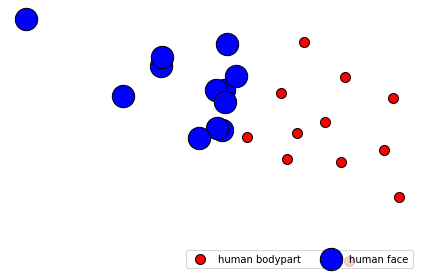

In [11]:
fig, ax = plt.subplots(1)
mds = MDS(2, random_state=0, dissimilarity='precomputed')
chance = 0.5
summary = mds.fit_transform(chance - confusion)
cmap = plt.get_cmap('rainbow')
colors = ['r', 'b']
names = list(conds['condition'].values)
for color, name in zip(colors, set(names)):
    sel = np.where([this_name == name for this_name in names])[0]
    size = 500 if name == 'human face' else 100
    ax.scatter(summary[sel, 0], summary[sel, 1], s=size,
               facecolors=color, label=name, edgecolors='k')
ax.axis('off')
ax.legend(loc='lower right', scatterpoints=1, ncol=2)
plt.tight_layout()
plt.show()